# Capstone Project : Used Cars Price Prediction

    1. get the data

    2.discovery in visualiztion
    > graph
    > perform distribution(histogram,boxplot)
    > perform outlier
    > perform correlation matrix
    
    3. preprocessing
    > handle missing values
    > prform feature scaling
    > perform one hot encoding  

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
cars = pd.read_csv('Updated 14-3-2021.csv')
cars.head(2)

,Unnamed: 0,region,price,manufacturer,model,condition,cylinders,fuel,odometer,title_status,...,VIN,drive,type,paint_color,description,state,lat,long,posting_date,age
0,0,sacramento,339998,NaN,LAMBORGHINI AVENTADOR,NaN,4.0,gas,5915.0,clean,...,ZHWUG4ZD2JLA06953,NaN,coupe,NaN,2018 Lamborghini Aventador LP 740 4 S AWD 2dr ...,ca,38.574553,-121.257580,2020-12-02T10:36:44-0800,3.0
1,1,worcester / central MA,325000,ferrari,488 spider,NaN,4.0,gas,684.0,clean,...,ZFF80AMA4K0242130,rwd,convertible,NaN,HighOctane Classics address: 143 Washington...,ma,42.209970,-71.807702,2020-11-24T09:04:51-0500,2.0


In [3]:
cars['title_status'].value_counts(normalize=True)

clean         0.965297
rebuilt       0.020054
salvage       0.007680
lien          0.006851
missing       0.000071
parts only    0.000047
Name: title_status, dtype: float64

In [4]:
# We want to consider that car which is in good shape
cars=cars[cars['title_status']=='clean']

In [5]:
# dropping the first irrelevant column from the dataset
cars.drop(columns=['Unnamed: 0','title_status'],inplace=True)

In [6]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 81444 entries, 0 to 84654
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   region        81444 non-null  object 
 1   price         81444 non-null  int64  
 2   manufacturer  80534 non-null  object 
 3   model         81328 non-null  object 
 4   condition     43237 non-null  object 
 5   cylinders     81444 non-null  float64
 6   fuel          80729 non-null  object 
 7   odometer      81444 non-null  float64
 8   transmission  80959 non-null  object 
 9   VIN           68411 non-null  object 
 10  drive         62196 non-null  object 
 11  type          69830 non-null  object 
 12  paint_color   60020 non-null  object 
 13  description   81442 non-null  object 
 14  state         81444 non-null  object 
 15  lat           80867 non-null  float64
 16  long          80867 non-null  float64
 17  posting_date  81444 non-null  object 
 18  age           81444 non-nu

In [7]:
cars.reset_index(drop=True,inplace=True)

In [8]:
cars.describe()

,price,cylinders,odometer,lat,long,age
count,81444.000000,81444.000000,8.144400e+04,80867.000000,80867.000000,81444.000000
mean,28505.666163,5.063479,3.622866e+04,38.856990,-97.198601,2.980355
std,15871.856580,1.502450,5.005903e+04,6.478758,19.068297,1.029390
min,103.000000,3.000000,0.000000e+00,8.872342,-159.713745,0.000000
25%,17995.000000,4.000000,1.586600e+04,34.245549,-116.742300,2.000000
50%,26990.000000,4.000000,2.919250e+04,39.337094,-91.755323,3.000000
75%,35995.000000,6.000000,4.652075e+04,42.885063,-82.321830,4.000000
max,339998.000000,12.000000,6.000000e+06,64.993698,-67.840490,4.000000


In [9]:
cars.shape

(81444, 19)

In [10]:
# Percent of nulls in the data
pd.DataFrame({'Columns':cars.columns,'Percent Nulls':(cars.isnull().sum()/len(cars) * 100).values})

,Columns,Percent Nulls
0,region,0.000000
1,price,0.000000
2,manufacturer,1.117332
3,model,0.142429
4,condition,46.911989
5,cylinders,0.000000
6,fuel,0.877904
7,odometer,0.000000
8,transmission,0.595501
9,VIN,16.002407


# Splitting the data into categorical and numerical

### splitting dependent and independent features

In [11]:
y=cars[['price']]
X=cars.drop(columns=['price'])

### Splitting the X,y into train and test

In [12]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=8)

In [13]:
# split train set into num and cat (fit_transform())
X_train_int=X_train.select_dtypes(include=np.number)
X_train_str=X_train.select_dtypes(exclude=np.number)
####################################################
#split test set into num and cat (transform())
X_test_int=X_test.select_dtypes(include=np.number)
X_test_str=X_test.select_dtypes(exclude=np.number)

In [14]:
# # Imputing nulls in Numerical columns by Iterative Imputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.linear_model import LinearRegression

In [15]:
X_train_int.columns

Index(['cylinders', 'odometer', 'lat', 'long', 'age'], dtype='object')

In [16]:
# Iterative Imputer for numerical column
from sklearn.impute import IterativeImputer
ii = IterativeImputer(estimator=LinearRegression(),random_state=8)

# fit_transform()
iter_X_train = pd.DataFrame(ii.fit_transform(X_train_int),columns=X_train_int.columns)
# transform()
iter_X_test = pd.DataFrame(ii.transform(X_test_int),columns=X_test_int.columns)

In [17]:
# sanity check 
iter_X_train.isnull().sum()

cylinders    0
odometer     0
lat          0
long         0
age          0
dtype: int64

In [18]:
# sanity check 
iter_X_test.isnull().sum()

cylinders    0
odometer     0
lat          0
long         0
age          0
dtype: int64

In [19]:
X_train.isnull().sum()

region              0
manufacturer      742
model              92
condition       30564
cylinders           0
fuel              567
odometer            0
transmission      389
VIN             10413
drive           15386
type             9264
paint_color     17149
description         1
state               0
lat               450
long              450
posting_date        0
age                 0
dtype: int64

In [20]:
X_train.condition.value_counts()

good         18963
excellent    10861
like new      4350
new            407
fair            10
Name: condition, dtype: int64

In [21]:
# X_random = X_train.condition.replace({'fair':1 ,'good':2,'excellent':3,'like new':4,'new':5})
# X_random

In [22]:
# X_random  = X_random.values.reshape(-1,1)

In [23]:
# from sklearn.impute import IterativeImputer
# from sklearn.tree import DecisionTreeClassifier
# ii = IterativeImputer(estimator=DecisionTreeClassifier(),random_state=8)

# # fit_transform()
# print(pd.DataFrame(ii.fit_transform(X_random)))
# # transform()
# iter_X_test_str = pd.DataFrame(ii.transform(X_test_str),columns=X_test_str.columns)

# imputing using KNN

from sklearn.impute import IterativeImputer
from sklearn.neighbors import KNeighborsClassifier
ii = IterativeImputer(estimator=KNeighborsClassifier(),random_state=8)

# fit_transform()
print(pd.DataFrame(ii.fit_transform(X_random)))
# transform()
# iter_X_test_str = pd.DataFrame(ii.transform(X_test_str),columns=X_test_str.columns)

In [24]:
# Imputing the null values in Categorical train data
misscol_X_train_str=list(np.where(X_train_str.isnull().sum())[0])
for i in misscol_X_train_str:
    X_train_str.iloc[:,i]=X_train_str.iloc[:,i].fillna(X_train_str.iloc[:,i].mode()[0])

F:\anaconda3\lib\site-packages\pandas\core\indexing.py:1048: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item_labels[indexer[info_axis]]] = value


In [25]:
# sanity check
X_train_str.isnull().sum()

region          0
manufacturer    0
model           0
condition       0
fuel            0
transmission    0
VIN             0
drive           0
type            0
paint_color     0
description     0
state           0
posting_date    0
dtype: int64

In [26]:
# Imputing nulls in categorical test columns 
misscol_X_test_str=list(np.where(X_test_str.isnull().sum())[0])
for i in misscol_X_test_str:
    X_test_str.iloc[:,i]=X_test_str.iloc[:,i].fillna(X_test_str.iloc[:,i].mode()[0])

In [27]:
# sanity check
X_test_str.isnull().sum()

region          0
manufacturer    0
model           0
condition       0
fuel            0
transmission    0
VIN             0
drive           0
type            0
paint_color     0
description     0
state           0
posting_date    0
dtype: int64

In [28]:
#########################################
X_train_int.head()

,cylinders,odometer,lat,long,age
56694,6.0,58402.0,38.549500,-90.381100,4.0
74859,4.0,73920.0,46.574457,-120.490540,3.0
25063,8.0,1506.0,34.000000,-81.030000,3.0
49911,6.0,34684.0,38.821080,-104.823110,2.0
44418,6.0,56902.0,28.792413,-81.231302,4.0


In [29]:
X_test_int.head()

,cylinders,odometer,lat,long,age
38259,4.0,11593.0,29.760000,-95.380000,3.0
15190,4.0,77561.0,28.015670,-82.459780,3.0
68103,4.0,12987.0,40.544000,-84.394400,4.0
12782,6.0,70935.0,47.812470,-122.321640,4.0
39188,4.0,90215.0,43.495074,-111.983471,4.0


In [30]:
X_train_str.head()

,region,manufacturer,model,condition,fuel,transmission,VIN,drive,type,paint_color,description,state,posting_date
56694,"st louis, MO",chrysler,300 s,excellent,gas,automatic,2C3CCABG6HH553736,rwd,sedan,black,2017 CHRYSLER 300 S You will not find a cleane...,il,2020-12-02T15:00:00-0600
74859,yakima,chevrolet,malibu,good,gas,automatic,1G1ZD5ST9JF198066,fwd,sedan,white,2018 Chevrolet Chevy Malibu LT Sedan 4D Of...,wa,2020-11-20T10:38:55-0800
25063,columbia,chevrolet,silverado 1500 crew,good,gas,automatic,3GCPCREC6JG623276,4wd,pickup,black,Carvana is the safer way to buy a car During t...,sc,2020-11-07T13:24:05-0500
49911,colorado springs,nissan,frontier crew cab sv,good,gas,other,1N6AD0ER5KN722485,fwd,pickup,blue,Carvana is the safer way to buy a car During t...,co,2020-11-29T07:47:45-0700
44418,orlando,ford,explorer,good,gas,automatic,1C4HJWDG6HL702229,fwd,SUV,white,➥ You can immediately confirm availability of...,fl,2020-11-27T11:41:33-0500


In [31]:
X_test_str.head()

,region,manufacturer,model,condition,fuel,transmission,VIN,drive,type,paint_color,description,state,posting_date
38259,houston,buick,regal tourx essence wagon,good,gas,other,W04GV8SX1J1134367,4wd,wagon,white,Carvana is the safer way to buy a car During t...,tx,2020-12-01T11:40:10-0600
15190,orlando,chevrolet,suburban,good,gas,automatic,1GNSCHKC6JR162791,fwd,SUV,white,2018 Chevrolet Chevy Suburban LT 1500 4x2 4dr ...,fl,2020-12-02T10:07:47-0500
68103,dayton / springfield,ford,fusion se,good,gas,automatic,1C4HJWDG6HL702229,4wd,sedan,white,Call 888-367-3856 Be sure to ask for Maxwell G...,oh,2020-11-05T12:01:10-0500
12782,eugene,ford,f-150 lariat,good,gas,automatic,1FTFW1EGXHFA49039,4wd,truck,white,our number one priority is the health and safe...,or,2020-12-02T20:00:02-0800
39188,east idaho,ford,f150 xlt,excellent,gas,automatic,1FTEW1EG4HKD64101,4wd,truck,white,**Back Up Camera/Remote Start/Great Deal**2017...,id,2020-11-11T10:53:53-0700


In [32]:
#concating the X_train (int+str)
X_train_joined=pd.concat([X_train_int,X_train_str],axis=1)

#concating the X_test (int+str)
X_test_joined=pd.concat([X_test_int,X_test_str],axis=1)


X_train_joined,y_train

X_test_joined,y_test


# EDA

## Getting the idea of the distribution of the data of the Numerical Feature

### Trim Mean

In [33]:
from scipy.stats import trim_mean
for i in X_train_joined.select_dtypes(include=np.number).columns:
    print(i)
    print('Mean',np.mean(X_train_joined[i]),'\n Trim_Mean',trim_mean(X_train_joined[i],0.01))

cylinders
Mean 5.061069756733942 
 Trim_Mean 5.043083332028252
odometer
Mean 36307.08518149029 
 Trim_Mean 34818.08840618295
lat
Mean 38.85319246789506 
 Trim_Mean 38.956336314707215
long
Mean -97.20127156774392 
 Trim_Mean -96.66727459735642
age
Mean 2.981444248330903 
 Trim_Mean 2.997290651966235


### From the above step we got the idea that there are outliers present in the price and odometer columns..we will confirm this by making significant graphs

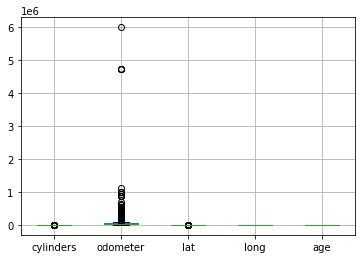

In [34]:
X_train_joined.select_dtypes(include=np.number).boxplot()
plt.show()

In [35]:
# Odometer has some extreme outliers present

## Price

In [36]:
print('Maximum Price:',y_train.price.max())
print('Minimum Price:',y_train.price.min())

Maximum Price: 339998
Minimum Price: 103


In [37]:
y_train.price.value_counts().sort_index()

103       4
116       1
120       1
122       1
125       2
         ..
269888    1
269999    1
272500    1
325000    1
339998    1
Name: price, Length: 8597, dtype: int64

F:\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


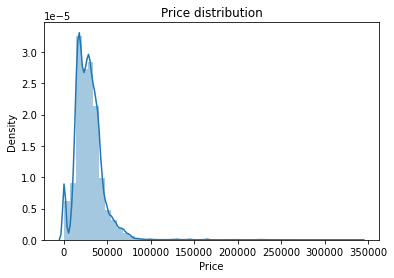

In [38]:
sns.distplot(y_train.price.sort_values()) #Original
plt.title('Price distribution')
plt.xlabel('Price')
plt.ylabel('Density')
plt.show()

F:\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


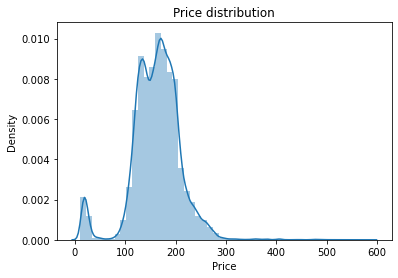

In [39]:
sns.distplot(np.sqrt(y_train.price)) #Original
plt.title('Price distribution')
plt.xlabel('Price')
plt.ylabel('Density')
plt.show()

In [40]:
np.mean(y_train.price)

28511.500606246642

In [41]:
np.median(y_train.price)

26990.0

F:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


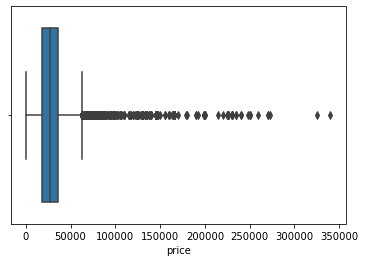

In [42]:
sns.boxplot(y_train.price.sort_values())
plt.show()

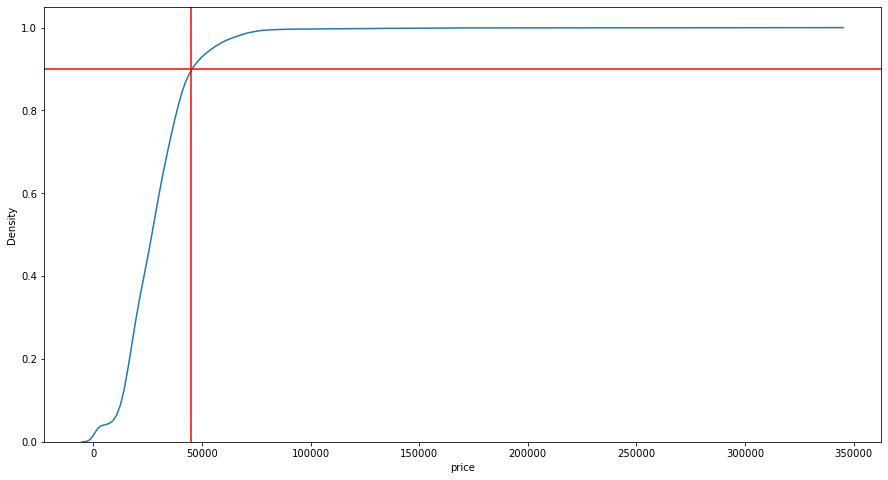

In [43]:
plt.figure(figsize=(15,8))
sns.kdeplot(y_train.price,cumulative=True)
plt.axhline(.9,c='r')
plt.axvline(45000,c='r')
plt.show()

### Here we get a idea that around 90% of the cars are cost less than 45000 $

### Odometer

In [44]:
print('Maximum odo:',X_train_joined.odometer.max())
print('Minimum odo:',X_train_joined.odometer.min())

Maximum odo: 6000000.0
Minimum odo: 0.0


In [45]:
X_train_joined.odometer.value_counts().sort_index()

0.0          103
1.0           92
2.0           25
3.0          124
4.0           52
            ... 
999000.0       1
999999.0       2
1111111.0      1
4728224.0      4
6000000.0      1
Name: odometer, Length: 25261, dtype: int64

In [46]:
### Their are around 103 cars while are not even driven i.e their odometer reading is 0.0

F:\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


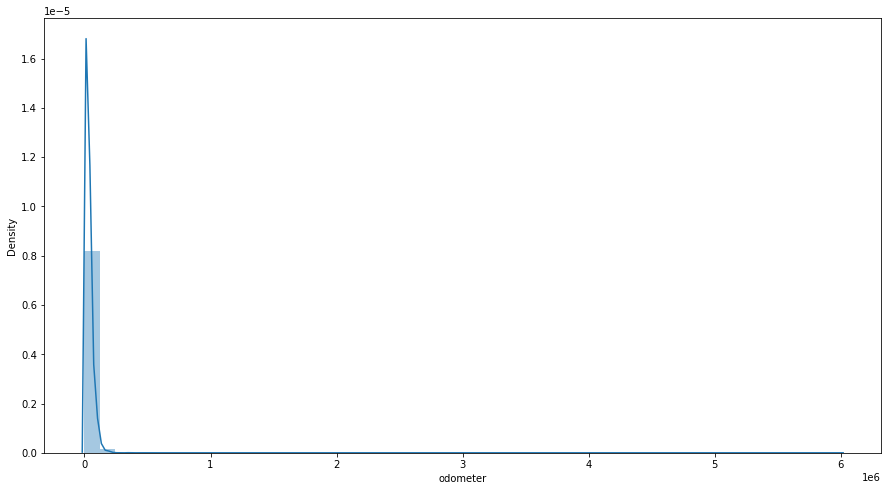

In [47]:
plt.figure(figsize=(15,8))
sns.distplot(X_train_joined.odometer)
plt.show()

F:\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


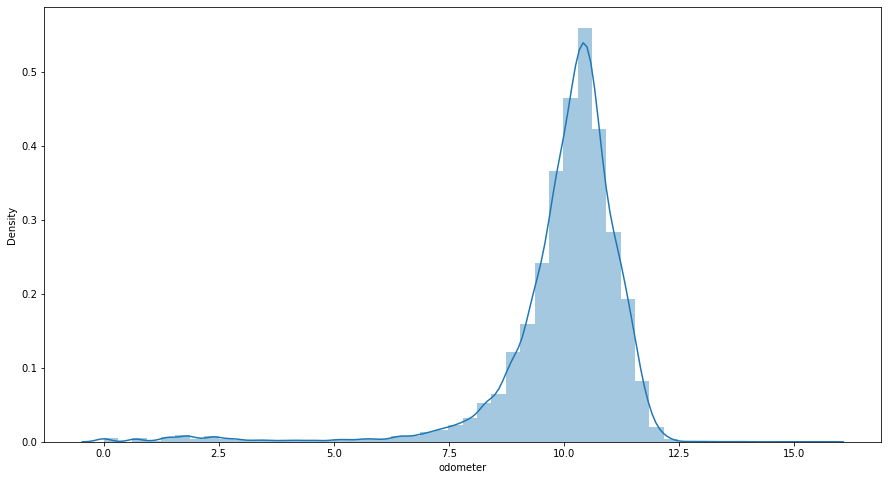

In [48]:
plt.figure(figsize=(15,8))
sns.distplot(np.log1p(X_train_joined.odometer))
plt.show()

F:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


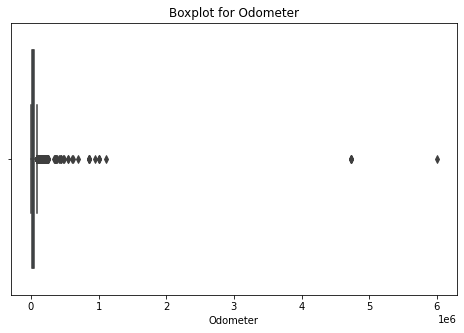

In [49]:
plt.figure(figsize=(8,5))
sns.boxplot(X_train_joined.odometer)
plt.xlabel('Odometer')
plt.title('Boxplot for Odometer')
plt.show()

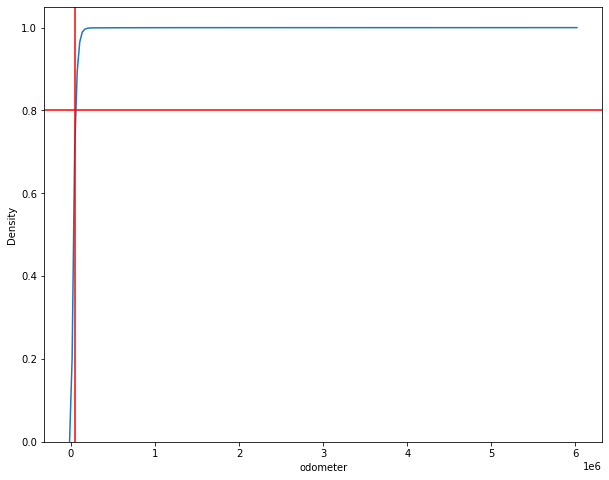

In [50]:
plt.figure(figsize=(10,8))
sns.kdeplot(X_train_joined.odometer.sort_values(),cumulative=True)
plt.axhline(.8,c='r')
plt.axvline(50000,c='r')
plt.show()

### Here we got a idea that around 80% of the are driven less than 50000 

In [51]:
X_train_joined.head(1)

,cylinders,odometer,lat,long,age,region,manufacturer,model,condition,fuel,transmission,VIN,drive,type,paint_color,description,state,posting_date
56694,6.0,58402.0,38.5495,-90.3811,4.0,"st louis, MO",chrysler,300 s,excellent,gas,automatic,2C3CCABG6HH553736,rwd,sedan,black,2017 CHRYSLER 300 S You will not find a cleane...,il,2020-12-02T15:00:00-0600


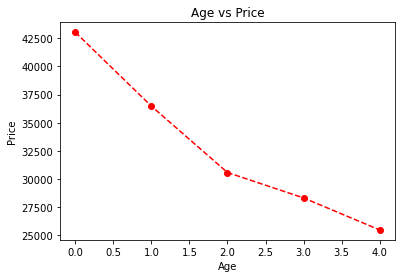

In [52]:
plt.plot(pd.concat([X_train_joined,y_train],axis=1).groupby(['age']).mean()['price'],'--or')
plt.xlabel('Age')
plt.ylabel('Price')
plt.title('Age vs Price')
plt.show()

F:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


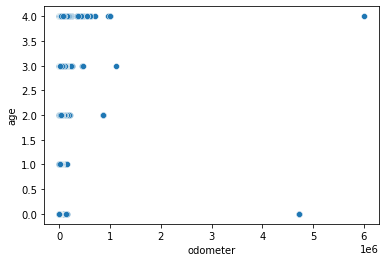

In [53]:
sns.scatterplot(pd.concat([X_train_joined,y_train],axis=1)['odometer'],pd.concat([X_train_joined,y_train],axis=1)['age'])

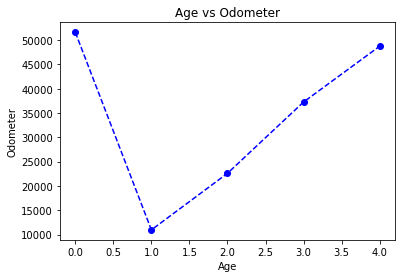

In [54]:
plt.plot(pd.concat([X_train_joined,y_train],axis=1).groupby(['age']).mean()['odometer'],'--ob')  
plt.xlabel('Age')
plt.ylabel('Odometer')
plt.title('Age vs Odometer')
plt.show()

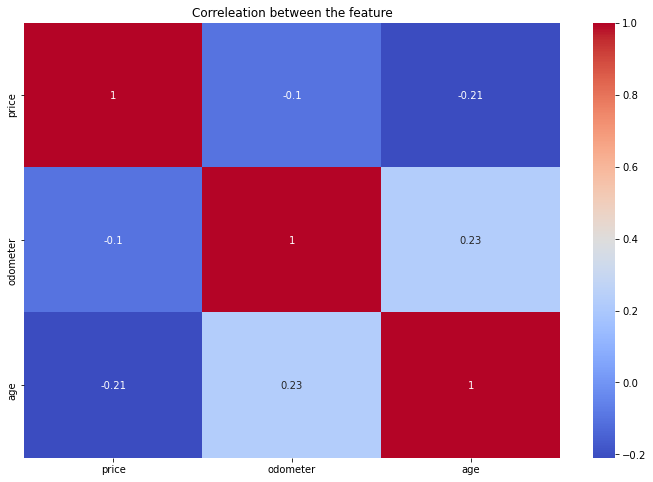

In [55]:
plt.figure(figsize=(12,8))
sns.heatmap(pd.concat([X_train_joined,y_train],axis=1).sort_values(by='price')[['price','odometer','age']].corr(),annot=True,cmap='coolwarm')
plt.title('Correleation between the feature')
plt.show()

In [56]:
### price vs age: *negatively corelated*
### odometer vs price: *negatively corelated*
### age vs odometer: *positively corelated* 

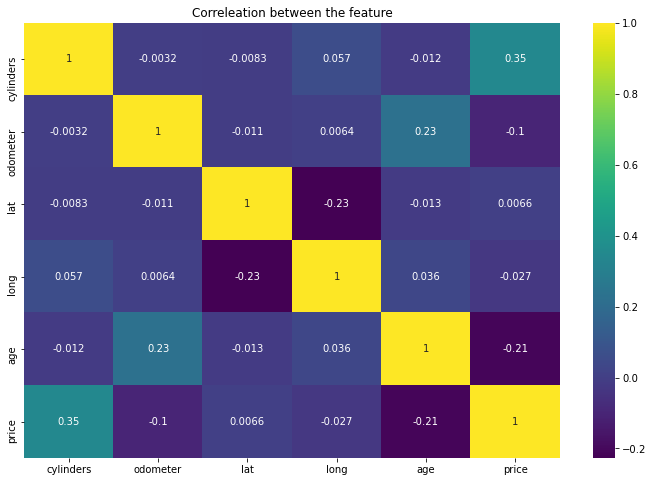

In [57]:
plt.figure(figsize=(12,8))
sns.heatmap(pd.concat([X_train_joined,y_train],axis=1).corr(),annot=True,cmap='viridis')
plt.title('Correleation between the feature')
plt.show()

In [58]:
# Price decreases as age increases

# Getting the idea of the distribution of the  data of the Categorical Feature

In [59]:
X_train_joined.head(2)

,cylinders,odometer,lat,long,age,region,manufacturer,model,condition,fuel,transmission,VIN,drive,type,paint_color,description,state,posting_date
56694,6.0,58402.0,38.549500,-90.38110,4.0,"st louis, MO",chrysler,300 s,excellent,gas,automatic,2C3CCABG6HH553736,rwd,sedan,black,2017 CHRYSLER 300 S You will not find a cleane...,il,2020-12-02T15:00:00-0600
74859,4.0,73920.0,46.574457,-120.49054,3.0,yakima,chevrolet,malibu,good,gas,automatic,1G1ZD5ST9JF198066,fwd,sedan,white,2018 Chevrolet Chevy Malibu LT Sedan 4D Of...,wa,2020-11-20T10:38:55-0800


### Region

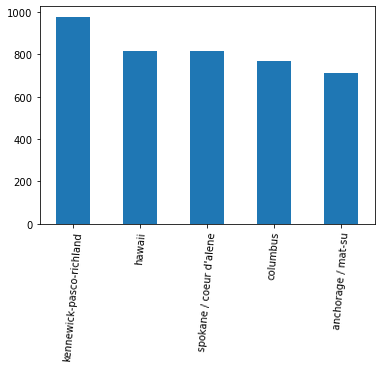

In [60]:
X_train_joined['region'].value_counts()[:5].plot(kind='bar')
plt.xticks(rotation=85)
plt.show()

### Manufacturer

F:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


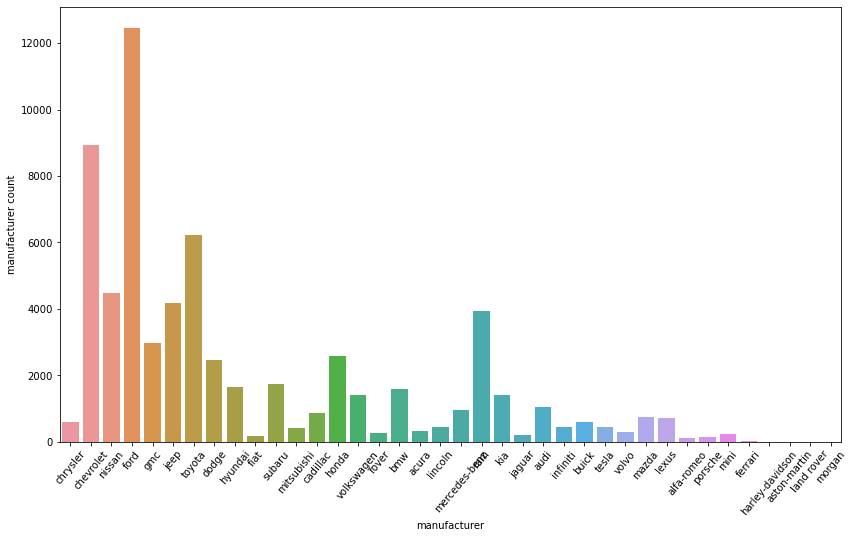

In [61]:
plt.subplots(figsize=(14,8))
sns.countplot(X_train_joined['manufacturer'])
plt.xticks(rotation=50)
plt.xlabel('manufacturer')
plt.ylabel('manufacturer count')
plt.show()

### Condition

F:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


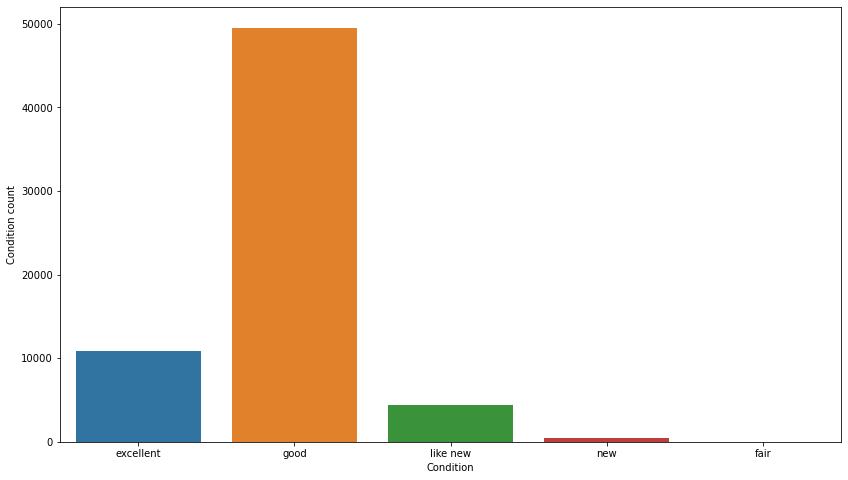

In [62]:
plt.subplots(figsize=(14,8))
sns.countplot(X_train_joined['condition'])
plt.xlabel('Condition')
plt.ylabel('Condition count')
plt.show()

### Fuel

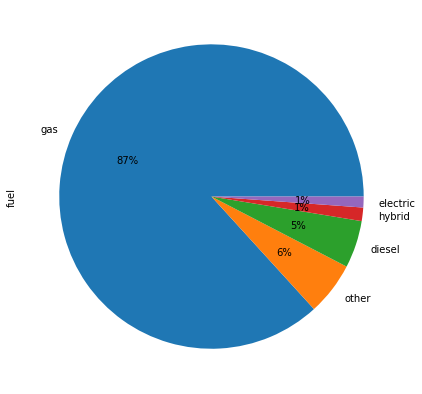

In [63]:
X_train_joined['fuel'].value_counts().plot(kind='pie',autopct='%1.0f%%',figsize=(7,7))
plt.show()

### Type

F:\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


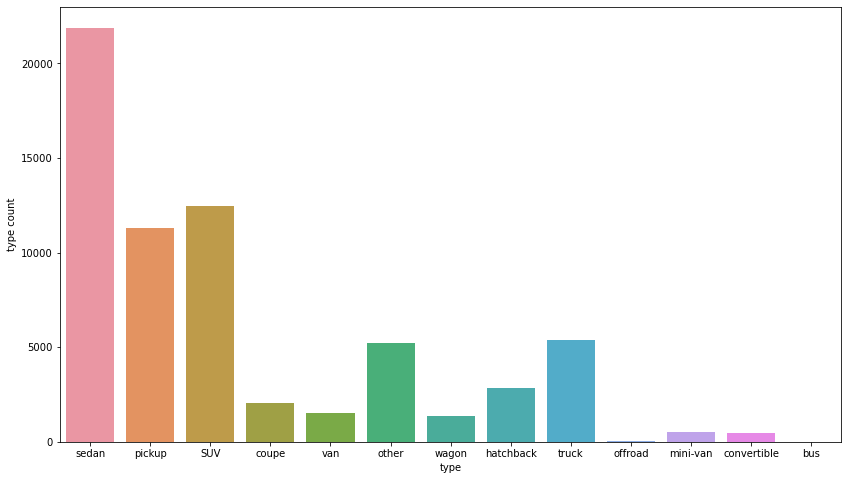

In [64]:
plt.subplots(figsize=(14,8))
sns.countplot(X_train_joined['type'])
plt.xlabel('type')
plt.ylabel('type count')
plt.show()

### Model

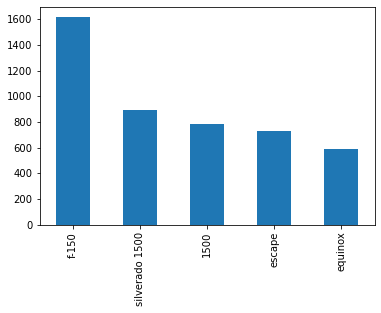

In [65]:

X_train_joined['model'].value_counts()[:5].plot(kind='bar')
plt.show()

### Transmission

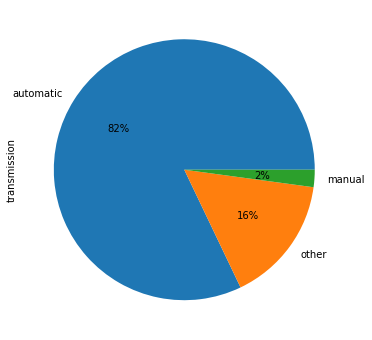

In [66]:
X_train_joined['transmission'].value_counts().plot(kind='pie',autopct='%1.0f%%',figsize=(6,6))
plt.show()

### Drive

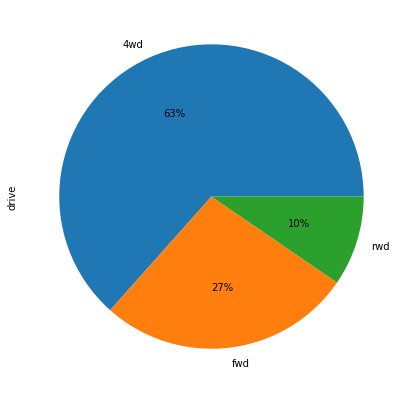

In [67]:
X_train_joined['drive'].value_counts().plot(kind='pie',autopct='%1.0f%%',figsize=(7,7))
plt.show()

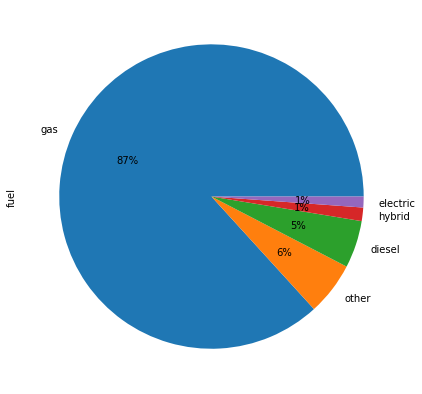

In [68]:
X_train_joined['fuel'].value_counts().plot(kind='pie',autopct='%1.0f%%',figsize=(7,7))
plt.show()

# Insights 

In [69]:
print('* The manufacture which produce the max no. of cars =>> ',X_train_joined['manufacturer'].value_counts().idxmax())
print('* Highest model =>> ',X_train_joined['model'].value_counts().idxmax())
print('* Fuel on which max car run =>> ',X_train_joined['fuel'].value_counts().idxmax())
print('* Max. type of vehicle  =>> ',X_train_joined['type'].value_counts().idxmax())
print('* Max. type of Region  =>> ',X_train_joined['region'].value_counts().idxmax())
print('* Max. type of manufacturer  =>> ',X_train_joined['manufacturer'].value_counts().idxmax())
print('* Max. type of condition  =>> ',X_train_joined['condition'].value_counts().idxmax())
print('* Max. type of Transmission =>> ',X_train_joined['transmission'].value_counts().idxmax())
print('* Max. type of drive  =>> ',X_train_joined['drive'].value_counts().idxmax())

* The manufacture which produce the max no. of cars =>>  ford
* Highest model =>>  f-150
* Fuel on which max car run =>>  gas
* Max. type of vehicle  =>>  sedan
* Max. type of Region  =>>  kennewick-pasco-richland
* Max. type of manufacturer  =>>  ford
* Max. type of condition  =>>  good
* Max. type of Transmission =>>  automatic
* Max. type of drive  =>>  4wd


# Bivariate

In [70]:
X_train_joined.select_dtypes(exclude=np.number).columns

Index(['region', 'manufacturer', 'model', 'condition', 'fuel', 'transmission',
       'VIN', 'drive', 'type', 'paint_color', 'description', 'state',
       'posting_date'],
      dtype='object')

In [71]:
X_train_joined.select_dtypes(exclude=np.number).head(2)

,region,manufacturer,model,condition,fuel,transmission,VIN,drive,type,paint_color,description,state,posting_date
56694,"st louis, MO",chrysler,300 s,excellent,gas,automatic,2C3CCABG6HH553736,rwd,sedan,black,2017 CHRYSLER 300 S You will not find a cleane...,il,2020-12-02T15:00:00-0600
74859,yakima,chevrolet,malibu,good,gas,automatic,1G1ZD5ST9JF198066,fwd,sedan,white,2018 Chevrolet Chevy Malibu LT Sedan 4D Of...,wa,2020-11-20T10:38:55-0800


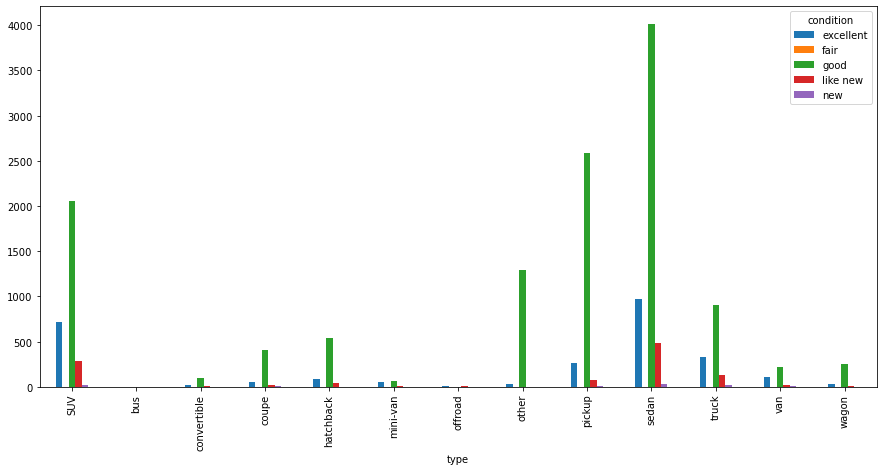

In [72]:
pd.crosstab(X_test_joined['type'],X_test_joined['condition']).plot(kind='bar',figsize=(15,7))
plt.show()

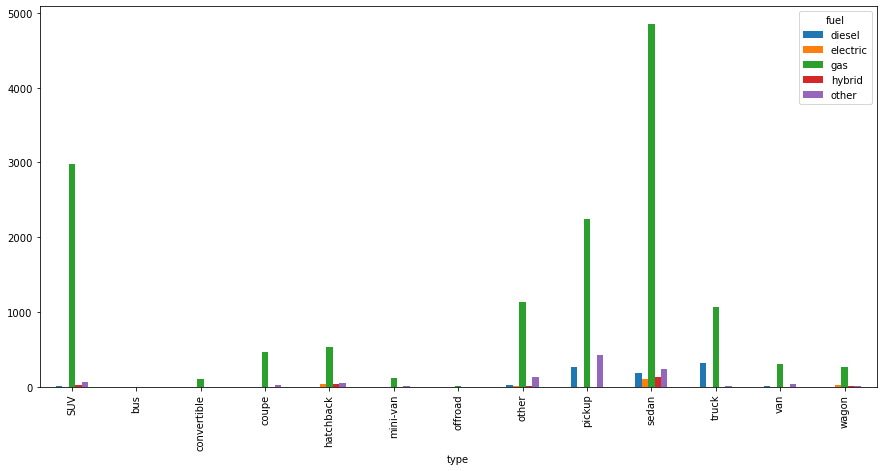

In [73]:
pd.crosstab(X_test_joined['type'],X_test_joined['fuel']).plot(kind='bar',figsize=(15,7))
plt.show()

In [74]:
# sns.pairplot(pd.concat([X_train_joined,y_train],axis=1),diag_kind='kde',hue='type')
# plt.show()

In [75]:
df_ford = X_train_joined[X_train_joined['manufacturer'] == 'ford'] 
df_c=X_train_joined[X_train_joined['manufacturer'] == 'chevrolet']
df_toyata = X_train_joined[X_train_joined['manufacturer'] == 'toyata'] 
df_honda=X_train_joined[X_train_joined['manufacturer'] == 'honda']
df_nissan = X_train_joined[X_train_joined['manufacturer'] == 'nissan'] 
df_jeep=X_train_joined[X_train_joined['manufacturer'] == 'jeep']
df_dodge = X_train_joined[X_train_joined['manufacturer'] == 'dodge'] 
df_gmc=X_train_joined[X_train_joined['manufacturer'] == 'gmc']
df_hyundai = X_train_joined[X_train_joined['manufacturer'] == 'hyundai'] 
df_ram=X_train_joined[X_train_joined['manufacturer'] == 'ram']

In [76]:
model = df_ford['model'].value_counts()
model_f = model.iloc[0:10]
df1=model_f.to_frame()
df1["Manufacturer"] = "ford"

model = df_c['model'].value_counts()
model_c = model.iloc[0:10]
df2=model_c.to_frame()
df2["Manufacturer"] = "chevrolet"

model = df_toyata['model'].value_counts()
model_toyata = model.iloc[0:10]
df3=model_toyata.to_frame()
df3["Manufacturer"] = "toyata"

model = df_honda['model'].value_counts()
model_honda = model.iloc[0:10]
df4=model_honda.to_frame()
df4["Manufacturer"] = "honda"

model = df_nissan['model'].value_counts()
model_nissan = model.iloc[0:10]
df5=model_nissan.to_frame()
df5["Manufacturer"] = "nissan"

model = df_jeep['model'].value_counts()
model_jeep = model.iloc[0:10]
df6=model_jeep.to_frame()
df6["Manufacturer"] = "jeep"

model = df_dodge['model'].value_counts()
model_dodge = model.iloc[0:10]
df7=model_dodge.to_frame()
df7["Manufacturer"] = "dodge"

model = df_gmc['model'].value_counts()
model_gmc = model.iloc[0:10]
df8=model_gmc.to_frame()
df8["Manufacturer"] = "gmc"

model = df_hyundai['model'].value_counts()
model_hyundai = model.iloc[0:10]
df9=model_hyundai.to_frame()
df9["Manufacturer"] = "hyundai"

model = df_ram['model'].value_counts()
model_ram = model.iloc[0:10]
df0=model_ram.to_frame()
df0["Manufacturer"] = "ram"

frames = [df1,df2,df3,df4,df5,df6,df7,df8,df9,df0]
result = pd.concat(frames)

In [77]:
result=result.reset_index()
result

,index,model,Manufacturer
0,f-150,1528,ford
1,escape,726,ford
2,explorer,455,ford
3,fusion,415,ford
4,f150 supercrew cab xlt,388,ford
...,...,...,...
85,1500 classic,98,ram
86,1500 quad cab big horn,79,ram
87,1500 crew cab rebel pickup,77,ram
88,1500 classic crew cab,65,ram


In [78]:
import plotly.express as px
fig =px.sunburst(
    result,path=['Manufacturer','index'],values='model', color='Manufacturer'
                  )
fig.update_layout(margin=dict(t=1, b=1, r=1, l=1))
fig.show()

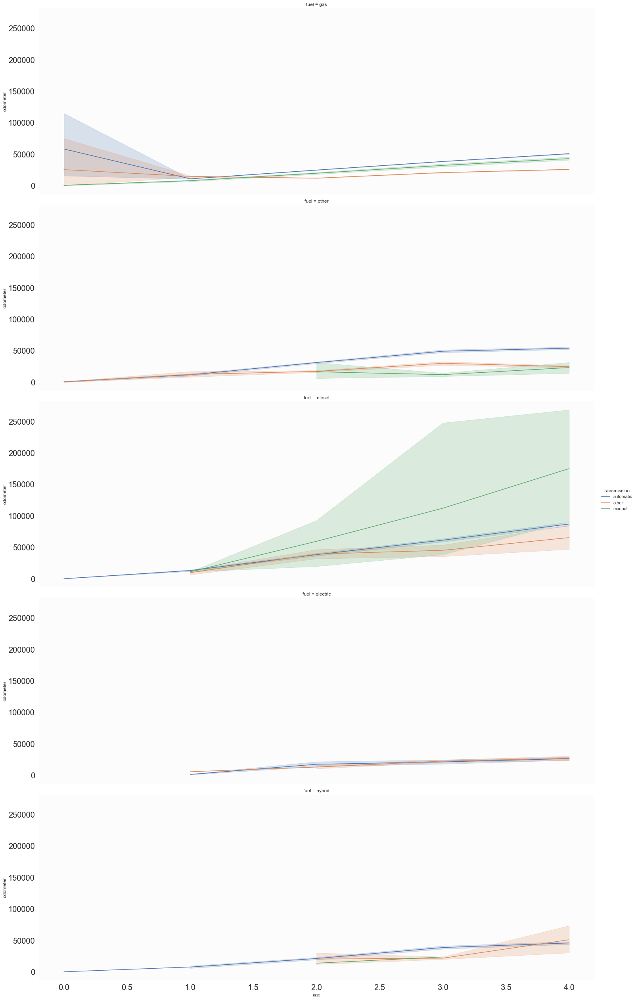

In [79]:
sns.set(rc={"axes.facecolor":"#fcfcfc", "axes.grid":False,'xtick.labelsize':20,'ytick.labelsize':20})
sns.relplot(x="age",y="odometer",data=X_train_joined,row="fuel",hue="transmission",kind='line',height= 7,aspect=3)

plt.show()

In [80]:
c = cars['fuel'].unique()

In [81]:
X_train_joined.head()

,cylinders,odometer,lat,long,age,region,manufacturer,model,condition,fuel,transmission,VIN,drive,type,paint_color,description,state,posting_date
56694,6.0,58402.0,38.549500,-90.381100,4.0,"st louis, MO",chrysler,300 s,excellent,gas,automatic,2C3CCABG6HH553736,rwd,sedan,black,2017 CHRYSLER 300 S You will not find a cleane...,il,2020-12-02T15:00:00-0600
74859,4.0,73920.0,46.574457,-120.490540,3.0,yakima,chevrolet,malibu,good,gas,automatic,1G1ZD5ST9JF198066,fwd,sedan,white,2018 Chevrolet Chevy Malibu LT Sedan 4D Of...,wa,2020-11-20T10:38:55-0800
25063,8.0,1506.0,34.000000,-81.030000,3.0,columbia,chevrolet,silverado 1500 crew,good,gas,automatic,3GCPCREC6JG623276,4wd,pickup,black,Carvana is the safer way to buy a car During t...,sc,2020-11-07T13:24:05-0500
49911,6.0,34684.0,38.821080,-104.823110,2.0,colorado springs,nissan,frontier crew cab sv,good,gas,other,1N6AD0ER5KN722485,fwd,pickup,blue,Carvana is the safer way to buy a car During t...,co,2020-11-29T07:47:45-0700
44418,6.0,56902.0,28.792413,-81.231302,4.0,orlando,ford,explorer,good,gas,automatic,1C4HJWDG6HL702229,fwd,SUV,white,➥ You can immediately confirm availability of...,fl,2020-11-27T11:41:33-0500


In [82]:
X_train_str.columns

Index(['region', 'manufacturer', 'model', 'condition', 'fuel', 'transmission',
       'VIN', 'drive', 'type', 'paint_color', 'description', 'state',
       'posting_date'],
      dtype='object')

In [83]:
X_train['manufacturer'].value_counts()

ford               11719
chevrolet           8942
toyota              6220
nissan              4493
jeep                4172
ram                 3944
gmc                 2987
honda               2577
dodge               2469
subaru              1749
hyundai             1649
bmw                 1601
kia                 1418
volkswagen          1402
audi                1042
mercedes-benz        946
cadillac             861
mazda                749
lexus                717
buick                603
chrysler             584
infiniti             453
lincoln              447
tesla                445
mitsubishi           432
acura                328
volvo                292
rover                260
mini                 233
jaguar               206
fiat                 174
porsche              154
alfa-romeo           118
ferrari               16
harley-davidson        7
aston-martin           2
morgan                 1
land rover             1
Name: manufacturer, dtype: int64

In [84]:
X_train['model'].value_counts()

f-150                        1522
silverado 1500                891
1500                          780
escape                        726
equinox                       585
                             ... 
q7 2.0 premium quattro          1
f-350 crew cab lariat 4x4       1
sierra 3500hd at4               1
f150 crew cab 4x4               1
forester 2.0xt touring aw       1
Name: model, Length: 5875, dtype: int64

In [85]:
table = pd.crosstab(X_train['manufacturer'],X_train['model'])

from scipy.stats import chi2_contingency
chi2_contingency(table,)

(2314313.448662541,
 0.0,
 204906,
 array([[5.08387618e-03, 5.08387618e-03, 6.10065142e-02, ...,
         5.08387618e-03, 2.28774428e-01, 5.08387618e-03],
        [1.83454859e-03, 1.83454859e-03, 2.20145831e-02, ...,
         1.83454859e-03, 8.25546866e-02, 1.83454859e-03],
        [3.10940439e-05, 3.10940439e-05, 3.73128527e-04, ...,
         3.10940439e-05, 1.39923198e-03, 3.10940439e-05],
        ...,
        [9.66713826e-02, 9.66713826e-02, 1.16005659e+00, ...,
         9.66713826e-02, 4.35021222e+00, 9.66713826e-02],
        [2.17813778e-02, 2.17813778e-02, 2.61376533e-01, ...,
         2.17813778e-02, 9.80162000e-01, 2.17813778e-02],
        [4.53973041e-03, 4.53973041e-03, 5.44767650e-02, ...,
         4.53973041e-03, 2.04287869e-01, 4.53973041e-03]]))

In [86]:
# Create CSV files of X_train , X_test, y_train, y_test

In [88]:
X_train_joined.to_csv('X_train.csv')

In [89]:
X_test_joined.to_csv('X_test.csv')

In [90]:
y_train.to_csv('y_train.csv')

In [91]:
y_test.to_csv('y_test.csv')